# Reconcile the PN and NR Gravitational Wave Simulations

Elaine Ran

## Load in waveforms and packages

In [44]:
import Pkg
using PythonCall
import CondaPkg
CondaPkg.add("numba", channel="numba")
CondaPkg.add("llvmlite", channel="numba")
CondaPkg.add("sxs", channel="conda-forge")

    CondaPkg Found dependencies: /Users/elaineran/.julia/environments/v1.10/CondaPkg.toml
    CondaPkg Found dependencies: /Users/elaineran/.julia/packages/PythonCall/S5MOg/CondaPkg.toml
    CondaPkg Found dependencies: /Users/elaineran/.julia/packages/PythonPlot/KcWMF/CondaPkg.toml
    CondaPkg Dependencies already up to date
    CondaPkg Found dependencies: /Users/elaineran/.julia/environments/v1.10/CondaPkg.toml
    CondaPkg Found dependencies: /Users/elaineran/.julia/packages/PythonCall/S5MOg/CondaPkg.toml
    CondaPkg Found dependencies: /Users/elaineran/.julia/packages/PythonPlot/KcWMF/CondaPkg.toml
    CondaPkg Dependencies already up to date
    CondaPkg Found dependencies: /Users/elaineran/.julia/environments/v1.10/CondaPkg.toml
    CondaPkg Found dependencies: /Users/elaineran/.julia/packages/PythonCall/S5MOg/CondaPkg.toml
    CondaPkg Found dependencies: /Users/elaineran/.julia/packages/PythonPlot/KcWMF/CondaPkg.toml
    CondaPkg Dependencies already up to date


In [45]:
using ForwardDiff, Optimization, OptimizationOptimJL, Plots, Quaternionic, LinearAlgebra

In [245]:
sxs = pyimport("sxs")
np = pyimport("numpy")
scipy = pyimport("scipy")

Python: <module 'scipy' from '/Users/elaineran/.julia/environments/v1.10/.CondaPkg/env/lib/python3.12/site-packages/scipy/__init__.py'>

should use `extrapolation_order=4`

In [5]:
waveform = sxs.load("SXS:BBH:0304/Lev/rhOverM", extrapolation_order=4)

Python:
WaveformModes([[-8.11271752e-05+1.14575452e-03j,  3.99190201e-05-4.46799636e-05…
         1.10227318e-04+1.13370685e-08j, ...,
         1.02234751e-06+1.77302800e-07j, -4.21128787e-06+5.03194508e-06j,
        -9.84366804e-07+2.04280972e-07j],
       [-9.00690142e-05+1.15279293e-03j, -9.26382833e-08-2.78473821e-05j,
         1.06784921e-04+7.88144784e-09j, ...,
         2.98684723e-07-9.35636834e-08j, -5.89682722e-06+3.53122651e-06j,
        -6.37586011e-07-7.28321751e-07j],
       [-9.06351758e-05+1.15498464e-03j, -4.16972891e-05+1.46202983e-06j,
         8.06311474e-05+1.66902426e-09j, ...,
        -8.64090473e-07-2.88526694e-07j, -4.02326486e-06-7.29230646e-07j,
         1.00690958e-07-1.31228141e-06j],
       ...,
       [ 2.42280517e-08+6.15572849e-06j, -1.25077426e-07+3.95530172e-07j,
         3.28419924e-05-2.32932245e-10j, ...,
         6.09263736e-10+1.22557379e-08j, -1.10105357e-08-1.92031869e-08j,
         4.91039485e-08-5.97827205e-08j],
       [ 1.84306322e-08+6.153

## Slice NR waveforms for cost function optimization

In [6]:
using PostNewtonian

Now we need to slice a certain part of PN and NR: we will choose all the times where $v < 0.35$ (corresponding to `PostNewtonian.Ω(v=0.35)=0.042875`)

In [7]:
t1 = 300
Ω2 = 0.042875
i1 = np.argmin(np.abs(waveform.t - t1))
i2 = np.argmin(np.abs(np.linalg.norm(waveform.angular_velocity[0:pyconvert(Int64, waveform.max_norm_index())], axis=1) - Ω2))

Python: 17820

`w_data` is going to be the NR waveform we compare our PN waveform with. It is indexed from i1 (817) to i2 (10790). We keep all of the times in that slice but only analyze the $\ell = 2$ and $\ell = 3$ modes (aka $(-3, 3), ..., (3, 3), (-2, 2), ...., (2, 2)$). That corresponds to the first 12 elements of the modes (hence the splice `[:, 1:12]`. The last `'` is necessary because originally `w_data`'s dimensions are 9974 x 12 while the PN waveform is 12 x 9974. Not sure which one should be transposed. Going to transpose `w_data` for now.

In [8]:
w_data = pyconvert(Array, waveform.data[pyconvert(Int, i1):pyconvert(Int, i2)])[:, 1:12]'

12×17502 adjoint(::Matrix{ComplexF64}) with eltype ComplexF64:
   -0.0378718+0.0681902im    …      -0.17601+0.0449874im
 -0.000537439-0.000854731im       -0.0010276-0.00491611im
   7.75098e-5+7.58294e-9im       0.000106618+1.93976e-10im
 -0.000537428+0.00085473im       -0.00102761+0.00491611im
   -0.0378718-0.0681902im           -0.17601-0.0449876im
    3.0614e-5-2.82962e-6im   …   0.000166414+0.000368097im
  0.000155997-0.000264373im       0.00176594-0.000280783im
   9.44578e-7+2.10834e-6im        5.47105e-6+2.0661e-5im
  -9.48412e-9+1.11898e-6im       -1.51033e-9-2.92907e-5im
  -9.42658e-7+2.10969e-6im       -5.47367e-6+2.06615e-5im
 -0.000156001-0.000264368im  …   -0.00176593-0.000280877im
  -3.06128e-5-2.83081e-6im      -0.000166415+0.000368096im

In [9]:
w_omega = pyconvert(Array, np.linalg.norm(waveform.angular_velocity[pyconvert(Int, i1):pyconvert(Int, i2)], axis=1)) #Omega

17502-element Vector{Float64}:
 0.012322086534942427
 0.012300269910426187
 0.012278167117071694
 0.01226425425948589
 0.012264292838521974
 0.012279523264196112
 0.01230619452546389
 0.012336730614053036
 0.012362291727261936
 0.012375551993404713
 0.012373131544087326
 0.01235653728925211
 0.012331662021842793
 ⋮
 0.04280968946515775
 0.042815599084465285
 0.0428215126907329
 0.04282743039719718
 0.04283334934009592
 0.04283927200931048
 0.04284520005732346
 0.04285112961603876
 0.04285706210902925
 0.04286299891772183
 0.04286893846227685
 0.042874881370858035

In [10]:
Φ = 0.0 # don't need to optimize over Φ
saveat = pyconvert(Array,waveform.t[pyconvert(Int, i1):pyconvert(Int, i2)]) .- pyconvert(Array, waveform.t[pyconvert(Int, i1)]) # all the times in NR and PN waveform


17502-element Vector{Float64}:
    0.0
    1.2802932349692355
    2.5605205769376767
    3.83919620016178
    5.119198990504458
    6.399104605100604
    7.679786421430435
    8.959556718502256
   10.239556148294014
   11.518248488702795
   12.796643754992147
   14.076129666762768
   15.356755364483092
    ⋮
 9380.407452031977
 9380.507405002996
 9380.607357973991
 9380.707310944965
 9380.807263915913
 9380.907216886842
 9381.007169857747
 9381.107122828627
 9381.207075799484
 9381.30702877032
 9381.406981741133
 9381.50693471192

In [11]:
ℓₘᵢₙ = 2
ℓₘₐₓ = 3

3

## Optimizing $\Omega$

try optimizing over different cost functions as well, optimize Omega with a cost function that is invariant over rotations (it doenst matter what value of R is put in there. Compute just the orbital evolution from which you get Omega/v, don't even need to compute modes. Get that info from the numerical data. 

In [12]:
function costfunction_omega(vars, params)
    #println(vars)
    bbh = BBH(vcat(params[1:8], components(R₀), vars[1], Φ))
    inspiral = orbital_evolution(bbh; saveat)
    return sum(abs2, [PostNewtonian.Ω(v=vec[13]) for vec in inspiral.u] - w_omega[1:length([PostNewtonian.Ω(v=vec[13]) for vec in inspiral.u])])
end

costfunction_omega (generic function with 1 method)

In [13]:
x0 = [PostNewtonian.v(Ω=0.01)]

1-element Vector{Float64}:
 0.21544346900318836

In [23]:
ForwardDiff.gradient((x0)->costfunction_omega(x0,params), x0)

1-element Vector{Float64}:
 -153.02514925974

In [24]:
cons(res, vars, p) = (res .= [vars[1]]) # Ω₁ < 0.3

cons (generic function with 1 method)

In [25]:
optf = OptimizationFunction(costfunction_omega, Optimization.AutoForwardDiff(),cons=cons)

(::OptimizationFunction{true, AutoForwardDiff{nothing, Nothing}, typeof(costfunction_omega), Nothing, Nothing, Nothing, typeof(cons), Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, typeof(SciMLBase.DEFAULT_OBSERVED_NO_TIME), Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing}) (generic function with 1 method)

In [26]:
prob = OptimizationProblem(optf, x0, params, lcons=[-Inf], ucons=[0.3])

OptimizationProblem. In-place: true
u0: 1-element Vector{Float64}:
 0.21544346900318836

In [27]:
sol = solve(prob, IPNewton())

retcode: Success
u: 1-element Vector{Float64}:
 0.2296537228443768

In [29]:
optimal_Ω = PostNewtonian.Ω(v=sol.u[1])

0.01211212851031051

## Choose initial parameters

In [15]:
metadata = sxs.load("SXS:BBH:0304/Lev/metadata.json")

Python: Metadata({'simulation_name': 'BBH_CFMS_d18.2_q1_sA_0_0_0.500_sB_0_0_-0.500/Lev4', 'alternative_names': ['PRIVATE:BBH:0190', 'SXS:BBH:0304'], 'initial_data_type': 'BBH_CFMS', 'object_types': 'BHBH', 'number_of_orbits': 28.9859962691, 'reference_mass_ratio': 0.9999970903758146, 'reference_chi_eff': 1.0546683449836972e-06, 'reference_chi1_perp': 1.3120893485700896e-08, 'reference_chi2_perp': 1.4726492300404849e-08, 'reference_eccentricity': 6.5e-05, 'reference_dimensionless_spin1': [2.07919784675e-08, 7.65688929398e-09, 0.499495909662], 'reference_dimensionless_spin2': [4.84291746772e-09, -2.06438720157e-09, -0.499492346983], 'reference_orbital_frequency': [2.40416579414e-10, 1.20899479244e-11, 0.0122543544294], 'reference_mass1': 0.500228439247, 'reference_mass2': 0.500229894728, 'reference_time': 640.0, 'reference_position1': [0.771483939171, 9.20003799988, 3.44358926454e-06], 'reference_position2': [-0.803031176984, -9.26407484931, 3.49269586618e-06], 'reference_mean_anomaly': 

In [159]:
M₁ = pyconvert(Float64, metadata.reference_mass1)
M₂ = pyconvert(Float64, metadata.reference_mass2)
χ⃗₁ = pyconvert(Array, metadata.reference_dimensionless_spin1)
χ⃗₂ = pyconvert(Array, metadata.reference_dimensionless_spin2)
Ωᵢ = optimal_Ω
#Ωᵢ = 0.01

0.01211212851031051

In [18]:
horizons = sxs.load("SXS:BBH:0308/Lev/Horizons")

Python: <sxs.horizons.Horizons object at 0x317ee3e00>

In [19]:
i_horizons = np.argmin(np.abs(horizons.n̂.t - 300))

Python: 600

In [20]:
λ̂ = QuatVec(vec(pyconvert(Array,horizons.λ̂[i_horizons])))
n̂ = QuatVec(vec(pyconvert(Array,horizons.n̂[i_horizons])))
l̂ = QuatVec(vec(pyconvert(Array,horizons.l̂[i_horizons])))

 + 0.010524635615896966𝐢 - 0.038536862618822845𝐣 + 0.9992017525328158𝐤

In [21]:
R₀ = align([imx, imy, imz], [n̂, λ̂, l̂])

rotor(-0.2828379430949773 + 0.010500384775201925𝐢 - 0.016996048163169578𝐣 + 0.958959631169222𝐤)

In [160]:
params = [M₁, M₂, χ⃗₁[1], χ⃗₁[2], χ⃗₁[3], χ⃗₂[1], χ⃗₂[2], χ⃗₂[3], components(R₀)[1], components(R₀)[2], 
    components(R₀)[3], components(R₀)[4], PostNewtonian.v(Ω = Ωᵢ)]

13-element Vector{Float64}:
  0.500228439247
  0.500229894728
  2.07919784675e-8
  7.65688929398e-9
  0.499495909662
  4.84291746772e-9
 -2.06438720157e-9
 -0.499492346983
 -0.2828379430949773
  0.010500384775201925
 -0.016996048163169578
  0.958959631169222
  0.2296537228443768

## Graphs

### $\Omega$ optimized

In [32]:
bbh = BBH(vcat(params[1:13], Φ))
inspiral = orbital_evolution(bbh; saveat)
h = inertial_waveform(inspiral; ℓₘᵢₙ, ℓₘₐₓ)

12×17502 Matrix{ComplexF64}:
    0.0323776+0.0722538im    …      0.166876+0.0674471im
   0.00106826-0.00345507im       -0.00326455-0.0099757im
   -0.0117701+1.77115e-5im        -0.0247573+0.000348455im
  -5.24041e-6-0.00181058im        0.00485841-0.00134005im
    0.0323751-0.0722439im           0.166684-0.0679951im
  -4.72934e-5-1.09633e-5im   …  -0.000301608+0.000395949im
 -0.000130094-0.000278266im       -0.0017026-0.000577412im
  -6.73875e-6+1.97613e-5im        4.83739e-5+0.000114338im
   1.72634e-7-5.62465e-6im        1.94615e-6-0.000101627im
  -4.99183e-6-1.70857e-5im        5.71437e-5-7.45066e-5im
  0.000131509-0.000280045im  …    0.00173943-0.000555117im
   1.94667e-5+8.6943e-7im        0.000138826+0.000324681im

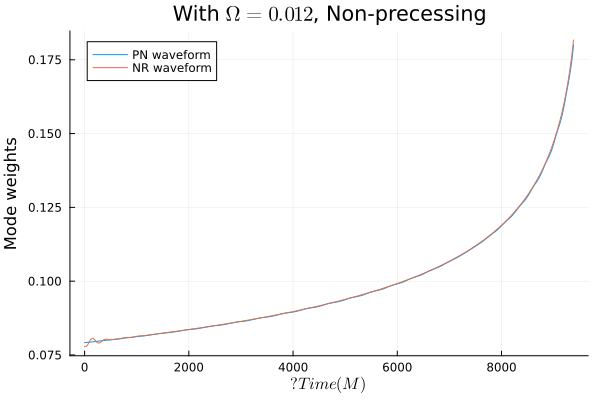

In [33]:
Plots.plot(inspiral.t, abs.(h[5, :]), label="PN waveform")
Plots.plot!(inspiral.t, abs.(w_data[5, : ]), label="NR waveform")
Plots.plot!(title=raw"With $\Omega = 0.012$, Non-precessing", xlabel=raw"$\text{Time }(M)$", ylabel="Mode weights")
#savefig("/Users/elaineran/Desktop/PostNewtonian versus Numerical for Non Precessing")

### $\Omega$ and $\chi_1$ and $\chi_2$ optimized

In [448]:
bbh7 = BBH(vcat(params[1:2], spin_newton_sol[1:6], params[9:13], Φ))
inspiral7 = orbital_evolution(bbh7; saveat)
h7 = inertial_waveform(inspiral7; ℓₘᵢₙ, ℓₘₐₓ)
bbh8 = BBH(vcat(params[1:2], spin_newton_sol_3[1:6], params[9:13], Φ))
inspiral8 = orbital_evolution(bbh8; saveat)
h8 = inertial_waveform(inspiral8; ℓₘᵢₙ, ℓₘₐₓ)
bbh9 = BBH(vcat(params[1:2], spin_newton_sol_6[1:6], params[9:13], Φ))
inspiral9 = orbital_evolution(bbh9; saveat)
h9 = inertial_waveform(inspiral9; ℓₘᵢₙ, ℓₘₐₓ)
bbh10 = BBH(vcat(params[1:2], spin_newton_sol_8[1:6], params[9:13], Φ))
inspiral10 = orbital_evolution(bbh10; saveat)
h10 = inertial_waveform(inspiral10; ℓₘᵢₙ, ℓₘₐₓ)

12×17502 Matrix{ComplexF64}:
    0.0329384+0.0730773im    …      0.136506+0.0710014im
  0.000625641-0.002991im           0.0322703+0.0237986im
   -0.0117695+0.000137274im       -0.0147837-0.00135709im
 -0.000116114-0.00215741im         -0.034348+0.0195787im
    0.0317297-0.0713199im           0.142782-0.065161im
  0.000111109-6.19424e-6im   …  -0.000102804-0.000565458im
 -0.000151133-0.000325541im      -0.00150704-0.000663454im
    1.6491e-5-6.17904e-6im       -0.00031873-0.000278471im
  -9.14253e-7-4.99712e-6im       -3.25566e-6-0.000193514im
   1.82211e-5+9.16926e-6im       -0.00030508+0.000354058im
  0.000143904-0.000298227im  …    0.00152811-0.00084014im
   0.00014309+7.72224e-7im      -0.000184257+0.000379552im

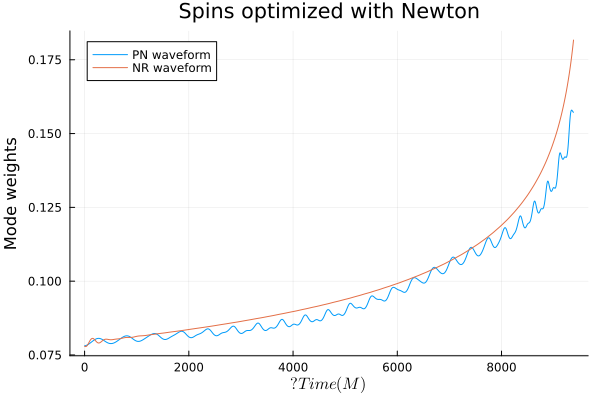

In [434]:
Plots.plot(inspiral.t, abs.(h7[5, :]), label="PN waveform")
Plots.plot!(inspiral.t, abs.(w_data[5, : ]), label="NR waveform")
Plots.plot!(title="Spins optimized with Newton", xlabel=raw"$\text{Time }(M)$", ylabel="Mode weights")
#savefig("/Users/elaineran/Desktop/PostNewtonian versus Numerical for Non Precessing spins optimized")

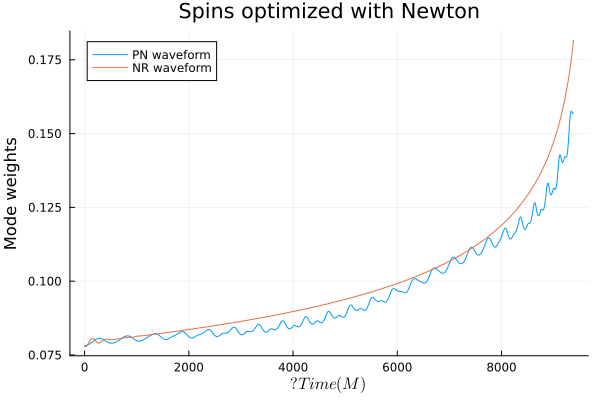

In [438]:
Plots.plot(inspiral.t, abs.(h8[5, :]), label="PN waveform")
Plots.plot!(inspiral.t, abs.(w_data[5, : ]), label="NR waveform")
Plots.plot!(title="Spins optimized with Newton", xlabel=raw"$\text{Time }(M)$", ylabel="Mode weights")
#savefig("/Users/elaineran/Desktop/PostNewtonian versus Numerical for Non Precessing spins optimized")

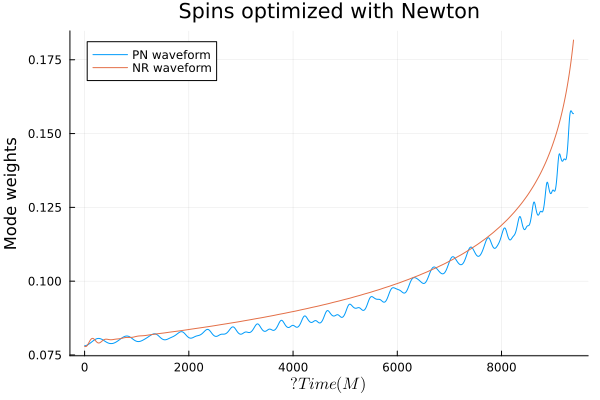

In [443]:
Plots.plot(inspiral.t, abs.(h9[5, :]), label="PN waveform")
Plots.plot!(inspiral.t, abs.(w_data[5, : ]), label="NR waveform")
Plots.plot!(title="Spins optimized with Newton", xlabel=raw"$\text{Time }(M)$", ylabel="Mode weights")
#savefig("/Users/elaineran/Desktop/PostNewtonian versus Numerical for Non Precessing spins optimized")

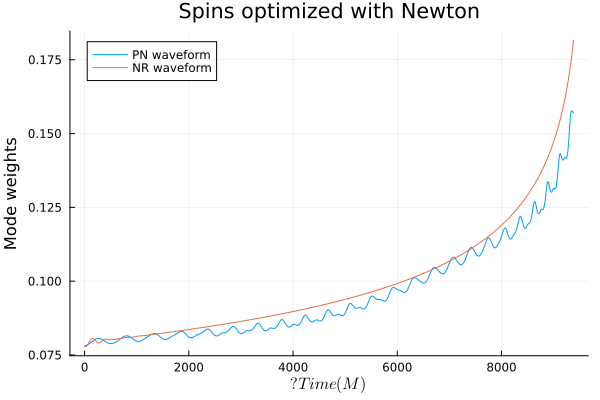

In [449]:
Plots.plot(inspiral.t, abs.(h10[5, :]), label="PN waveform")
Plots.plot!(inspiral.t, abs.(w_data[5, : ]), label="NR waveform")
Plots.plot!(title="Spins optimized with Newton", xlabel=raw"$\text{Time }(M)$", ylabel="Mode weights")
#savefig("/Users/elaineran/Desktop/PostNewtonian versus Numerical for Non Precessing spins optimized")

### $\Omega$ and R

In [122]:
bbh2 = BBH(vcat(params[1:8], components(exp(QuatVec(bfgssol[1:3]))), params[13], Φ))
inspiral2 = orbital_evolution(bbh2; saveat)
h2 = inertial_waveform(inspiral2; ℓₘᵢₙ, ℓₘₐₓ)

12×17502 Matrix{ComplexF64}:
  -0.0132851+0.0780412im    …     -0.144814+0.107136im
  -0.0038655-0.000374828im      -0.00860577-0.00552037im
  -0.0116199-5.00669e-5im        -0.0243921-0.000447474im
  0.00236905-0.00163617im       0.000246312-0.00817742im
  -0.0132888-0.0780335im          -0.144256-0.107364im
  3.18231e-5+3.24234e-5im   …  -0.000207614+0.000414304im
  5.59715e-5-0.000302374im       0.00151226-0.000995482im
  2.01387e-5+1.94808e-6im        7.82449e-5+8.79515e-5im
  1.19312e-7+6.26139e-6im        4.30949e-7+9.85512e-5im
  1.76863e-5-4.05256e-6im        3.82891e-5-0.000100812im
 -5.77907e-5-0.00030361im   …   -0.00153692-0.000961969im
 -2.28894e-6+2.59358e-5im       0.000298974+0.00026189im

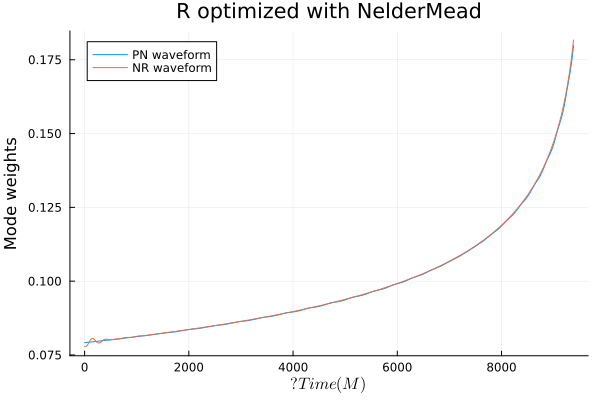

In [123]:
Plots.plot(inspiral.t, abs.(h2[5, :]), label="PN waveform")
Plots.plot!(inspiral.t, abs.(w_data[5, : ]), label="NR waveform")
Plots.plot!(title="R optimized with NelderMead", xlabel=raw"$\text{Time }(M)$", ylabel="Mode weights")
#savefig("/Users/elaineran/Desktop/PostNewtonian versus Numerical for Non Precessing R optimized")

### $\Omega$ and R and spins

In [485]:
bbh11 = BBH(vcat(params[1:2], spin_r_newton_sol[1:6], components(exp(QuatVec(spin_r_newton_sol[7:9]))), params[13], Φ))
inspiral11 = orbital_evolution(bbh11; saveat)
h11 = inertial_waveform(inspiral11; ℓₘᵢₙ, ℓₘₐₓ)

12×17468 Matrix{ComplexF64}:
   -0.0335376+0.0723535im    …    -68.0843+124.239im
  -0.00226708-0.00162811im         21.1368-4.55032im
   -0.0116725-0.000826971im       -2.33451-0.0590605im
   0.00430277-0.000247389im       -20.2761-4.86358im
   -0.0307168-0.0725619im         -68.8858-123.374im
  -8.00884e-5-6.88607e-5im   …    0.028031+0.383413im
  0.000107647-0.000267679im       0.230563+0.421588im
  -2.96386e-6-6.19057e-6im       0.0795683-0.0409598im
  -5.73196e-7+2.6133e-6im        0.0155955+0.137143im
  -1.19477e-6+6.13197e-6im        0.087701+0.104134im
 -0.000127252-0.00024173im   …   -0.286544+0.741647im
  -6.92799e-5-1.15844e-5im      -0.0940421+0.341561im

In [486]:
bbh11

BBH{Vector{Float64}, 9223372036854775805//2}([0.500228439247, 0.500229894728, 0.5216961340483434, 0.684336790129797, -0.4995160672029071, -0.5240963022230349, -0.12572899777426622, 0.7176211836031154, -0.023313109189523874, -0.8785131662131928, -0.4771108562088311, 0.006028815610440075, 0.2296537228443768, 0.0])

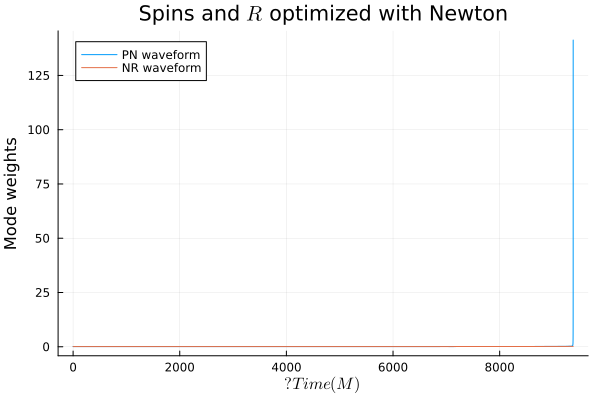

In [487]:
Plots.plot(inspiral.t[1:17468], abs.(h11[5, :]), label="PN waveform")
Plots.plot!(inspiral.t[1:17468], abs.(w_data[5, 1:17468 ]), label="NR waveform")
Plots.plot!(title=raw"Spins and $R$ optimized with Newton", xlabel=raw"$\text{Time }(M)$", ylabel="Mode weights")
#savefig("/Users/elaineran/Desktop/julia-optimization/PostNewtonian versus Numerical for Non Precessing R + spins optimized")

### $\Omega$ and R and M2

In [491]:
bbh1 = BBH(vcat(sol.u[1], params[2:8], components(exp(QuatVec(sol.u[2:4]))), params[13], Φ))
inspiral1 = orbital_evolution(bbh1; saveat)
h1 = inertial_waveform(inspiral1; ℓₘᵢₙ, ℓₘₐₓ)

12×17502 Matrix{ComplexF64}:
    0.0278295+0.00289575im   …     0.0658886+0.0683556im
    0.0653935+0.0274576im         -0.0239858+0.0215914im
   -0.0310285-0.000893044im        -0.168366+0.00216832im
   -0.0651529+0.0292211im          0.0272074+0.0281712im
    0.0281551-0.00295278im         0.0643638-0.071818im
  -4.56482e-6-9.18625e-5im   …   0.000521753-0.000178754im
    5.3811e-5+0.000140032im       0.00124122+0.00123497im
  -8.59403e-5-5.82971e-5im       -5.03626e-5-0.000349232im
  -5.84542e-5-0.000164558im     -0.000970042+0.000182867im
  0.000463754-0.000115097im      0.000313506+0.000484468im
 -0.000137638-4.11388e-5im   …  -0.000554834+0.000310811im
 -0.000114029+0.000258516im      0.000245612+0.000207554im

In [501]:
Plots.plot(inspiral.t, abs.(h1[5, :]), label="PN waveform")
Plots.plot!(inspiral.t, abs.(w_data[5, : ]), label="NR waveform")
Plots.plot!(title=raw"$M_2$ and $R$ optimized with IPNewton", xlabel=raw"$\text{Time }(M)$", ylabel="Mode weights")
#savefig("/Users/elaineran/Desktop/PostNewtonian versus Numerical for Non Precessing R + M2 optimized")

"/Users/elaineran/Desktop/PostNewtonian versus Numerical for Non Precessing R + M2 optimized.png"

### $\Omega$, R, M1 and M2

In [493]:
bbh3 = BBH(vcat(sol.u[1], sol.u[2], params[3:8], components(exp(QuatVec(sol.u[3:5]))), params[13], Φ))
inspiral3 = orbital_evolution(bbh3; saveat)
h3 = inertial_waveform(inspiral3; ℓₘᵢₙ, ℓₘₐₓ)

12×17502 Matrix{ComplexF64}:
   -0.0625471-0.0482236im    …      0.178518-0.076933im
  -0.00198144-0.00359829im         0.0111293+0.00670625im
   -0.0115887-7.35371e-5im        -0.0258358+0.000649115im
 -0.000496015-0.00276947im       -0.00847287-0.00578934im
   -0.0625645+0.048218im            0.179082+0.0766587im
  0.000365369+0.000544096im  …    0.00161531+0.00181236im
  0.000244198+0.000226408im      -0.00203546+0.0008401im
   2.68592e-5+2.50462e-5im      -0.000178675-0.000124146im
   1.94332e-6+6.24234e-6im        3.55292e-6+0.000116531im
   -1.2416e-5-1.06364e-5im        -0.0001229-4.68514e-5im
 -0.000240288+0.000159875im  …    0.00209153+0.000569474im
 -0.000395357+0.000549009im      -0.00148301+0.00194899im

In [502]:
Plots.plot(inspiral.t, abs.(h3[5, :]), label="PN waveform")
Plots.plot!(inspiral.t, abs.(w_data[5, : ]), label="NR waveform")
Plots.plot!(title=raw"$M_1$ and $M_2$ and $R$ optimized with IPNewton", xlabel=raw"$\text{Time }(M)$", ylabel="Mode weights")
savefig("/Users/elaineran/Desktop/PostNewtonian versus Numerical for Non Precessing R + M2 + M1 optimized")

"/Users/elaineran/Desktop/PostNewtonian versus Numerical for Non Precessing R + M2 + M1 optimized.png"

### $\Omega$, R, M2 and M1 with M1 + M2 = 1

In [133]:
bbh4 = BBH(vcat(sol.u[1], sol.u[2], params[3:8], components(exp(QuatVec(sol.u[3:5]))), params[13], Φ))
inspiral4 = orbital_evolution(bbh4; saveat)
h4 = inertial_waveform(inspiral4; ℓₘᵢₙ, ℓₘₐₓ)

12×17502 Matrix{ComplexF64}:
   -0.0506431+0.0606758im    …    0.0771587+0.169849im
  -0.00388088-0.00124214im      -0.00899124+0.00888177im
   -0.0115973-7.00522e-5im        -0.025731-0.000232559im
   0.00160774-0.00231915im       0.00279956-0.000881643im
   -0.0506387-0.0606894im         0.0776945-0.170088im
  0.000139033-0.000533312im  …  -0.00178169-0.000122684im
  0.000230322-0.000234789im     -0.00071101-0.00194965im
   3.40592e-5+5.71433e-7im      0.000139595-0.000149872im
   1.67125e-6+6.24761e-6im       1.13252e-5+0.000112987im
   1.03548e-6-1.51141e-5im        6.0066e-5+1.09738e-5im
 -0.000173948-0.000233678im  …  0.000668694-0.00176124im
 -0.000122791-0.000558946im      0.00195416-0.000110779im

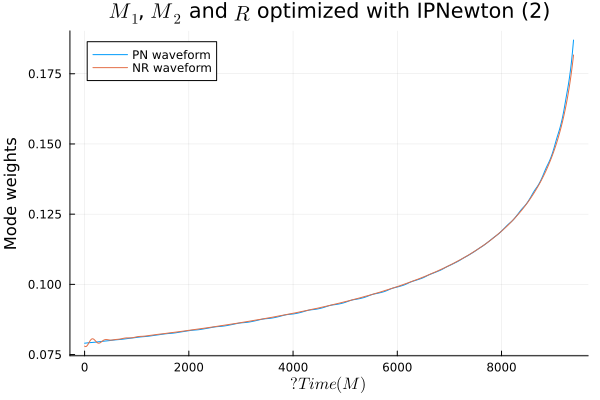

In [134]:
Plots.plot(inspiral.t, abs.(h4[5, :]), label="PN waveform")
Plots.plot!(inspiral.t, abs.(w_data[5, : ]), label="NR waveform")
Plots.plot!(title=raw"$M_1$, $M_2$ and $R$ optimized with IPNewton (2)", xlabel=raw"$\text{Time }(M)$", ylabel="Mode weights")
#savefig("/Users/elaineran/Desktop/PostNewtonian versus Numerical for Non Precessing R + M2 + M1 optimized")

### $\Omega$ and M1 and M2 with M1 + M2 = 1

In [51]:
bbh5 = BBH(vcat(sol.u[1], sol.u[2], params[3:13], Φ))
inspiral5 = orbital_evolution(bbh5; saveat)
h5 = inertial_waveform(inspiral5; ℓₘᵢₙ, ℓₘₐₓ)

12×17502 Matrix{ComplexF64}:
   0.0320932+0.0716294im    …      0.159358+0.00123643im
 0.000735881-0.0029491im        -0.00421402-0.000693958im
  -0.0116731+4.07559e-6im        -0.0222604-0.000236046im
 -0.00032881-0.00226795im        0.00449413-0.00434201im
   0.0320847-0.0715741im           0.159465-0.0006376im
 -0.00124591-0.000222439im  …    0.00017857-0.00390343im
 -9.51136e-5-0.000237976im      -0.00152471+0.000181619im
  1.24826e-5-9.56442e-6im         4.9599e-5+0.00012273im
 -4.43982e-6-5.55433e-6im        6.69171e-6-6.63664e-5im
 -2.44371e-5-4.69667e-5im        5.94436e-5+2.93455e-5im
 0.000169541-0.000329208im  …    0.00133723-5.44764e-5im
  0.00121768-0.000210382im     -0.000276787-0.00404487im

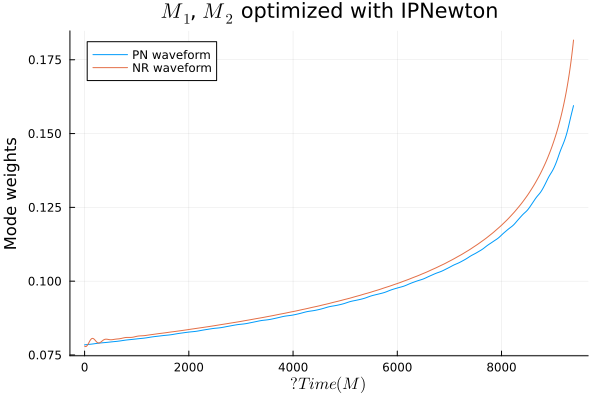

In [52]:
Plots.plot(inspiral.t, abs.(h5[5, :]), label="PN waveform")
Plots.plot!(inspiral.t, abs.(w_data[5, : ]), label="NR waveform")
Plots.plot!(title=raw"$M_1$, $M_2$ optimized with IPNewton", xlabel=raw"$\text{Time }(M)$", ylabel="Mode weights")
#savefig("/Users/elaineran/Desktop/PostNewtonian versus Numerical for Non Precessing R + M2 + M1 optimized")

### $\Omega$, R, M1, M2 (M1 + M2 = 1) and v

In [145]:
bbh6 = BBH(vcat(sol.u[1], sol.u[2], params[3:8], components(exp(QuatVec(sol.u[3:5]))), sol.u[6], Φ))
inspiral6 = orbital_evolution(bbh6; saveat)
h6 = inertial_waveform(inspiral6; ℓₘᵢₙ, ℓₘₐₓ)

┌ Warning: Terminating evolution because the time-step size has become very small:
│ |dt=1.2633198483038559e-8| < √ϵ=1.4901161193847656e-8
│ This is only unexpected for 𝑣 ≲ 1/2; the current value is 𝑣=0.3759662559478896.
└ @ PostNewtonian ~/.julia/packages/PostNewtonian/wUPru/src/utilities/termination_criteria.jl:121


12×17502 Matrix{ComplexF64}:
   0.00101126-0.000767021im  …   -0.00126785+0.000118256im
  -8.12941e-5-0.000104972im      -9.13551e-5+6.34938e-5im
  -0.00018615+6.85252e-6im      -0.000184175+9.34106e-6im
   2.16837e-5+8.0819e-5im       -0.000103882+5.69745e-5im
   0.00101788+0.000765656im      -0.00126781-0.000111465im
 -0.000149569-0.000104591im  …   0.000181907-2.31115e-5im
  -1.13141e-5+1.68078e-5im        1.18685e-5-1.01899e-5im
    2.6171e-6+5.27359e-6im        4.93311e-6-9.17788e-7im
   4.96742e-7-5.88708e-8im       -4.55139e-8+7.84868e-9im
  -1.08638e-6+4.57257e-6im       -5.11396e-6+7.71048e-7im
   1.02982e-5-1.24144e-6im   …   -1.47791e-5+8.3908e-6im
  0.000149709-0.00010589im      -0.000181943-2.17951e-5im

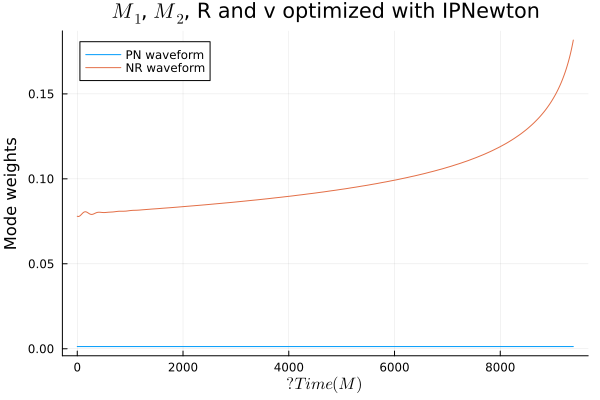

In [147]:
Plots.plot(inspiral.t, abs.(h6[5, :]), label="PN waveform")
Plots.plot!(inspiral.t, abs.(w_data[5, : ]), label="NR waveform")
Plots.plot!(title=raw"$M_1$, $M_2$, R and v optimized with IPNewton", xlabel=raw"$\text{Time }(M)$", ylabel="Mode weights")
#savefig("/Users/elaineran/Desktop/PostNewtonian versus Numerical for Non Precessing R + M2 + M1 optimized")

## Define what to optimize on

Trying to optimize over `R`: Avoid using `x0 = [0.0, 0.0, 0.0]` which leads to issues with `NaN`s when trying to differentiate. Avoid optimizing over $\chi_1$ and $\chi_2$ for now, issues with ForwardDiff and Quaternionic.

In [457]:
x0 = vcat(spin_newton_sol_8, bfgssol)
#x0 = [0.0, 0.0, 0.1]
#x0 = vcat(0.5, 0.5, nmsol)
#x0 = params[1:2]

9-element Vector{Float64}:
 -0.35303591961852226
  0.8099579675267655
  0.3615268082075243
  0.008333206760032009
 -0.07929563309642998
 -0.1337497364792274
 -1.440820441226644
 -0.670307827450506
  0.012505419521100286

Creates a PN wavefunction. `saveat` argument used to only index over the 9974 previously selected times of `w_data`. It seems like if you want forward autodifferentiation to work we must use `PNOrder = 3//2` or lower.

In [480]:
function wavefunction(vars, params)
    # χ₁ and χ₂ and R optimization
    bbh = BBH(vcat(params[1:2], vars[1:6], components(exp(QuatVec(vars[7], vars[8], vars[9]))*R₀), params[13], Φ))

    # just R optimization
   # bbh = BBH(vcat(params[1:8], components(exp(QuatVec(vars[1], vars[2], vars[3]))*R₀), params[13], Φ); PNOrder = 3//2)

    # χ₁ and χ₂ optimization
    #bbh = BBH(vcat(params[1:2], vars, params[9:13], Φ); PNOrder = 3//2)

    # M1 and M2 optimization
    #bbh = BBH(vcat(vars[1], vars[2], params[3:13], Φ); PNOrder = 3//2)
    
    # M1 and M2 and R optimization
    #bbh = BBH(vcat(vars[1:2], params[3:8], components(exp(QuatVec(vars[3], vars[4], vars[5]))*R₀), params[13], Φ); PNOrder = 3//2)

    # M1 and M2 and R and v optimization
    #bbh = BBH(vcat(vars[1:2], params[3:8], components(exp(QuatVec(vars[3], vars[4], vars[5]))*R₀), vars[6], Φ); PNOrder = 3//2)
    #try
        inspiral = orbital_evolution(bbh; saveat)
    #catch ExceptionError e
    #    Inf
    #end
    
    if inspiral.retcode ∈ (ReturnCode.Success, ReturnCode.Terminated, ReturnCode.DtLessThanMin)
        inertial_waveform(inspiral; ℓₘᵢₙ, ℓₘₐₓ, PNOrder = 3//2)
    else
        Inf
    end
end

wavefunction (generic function with 1 method)

costfunction should catch bad evolutions

In [337]:
Base.Float64(q::QuatVecF64) = q

In [348]:
(0.95 * QuatVec(1, 2, 3) / abs2vec(QuatVec(1, 2, 3))).components

4-element StaticArraysCore.SVector{4, Float64} with indices SOneTo(4):
 0.0
 0.06785714285714285
 0.1357142857142857
 0.20357142857142854

In [453]:
function costfunction(vars, params)
    costmult = 1
    if typeof(vars) != Vector{Float64}
        if typeof(vars[1].value) != Float64
            println("if vars are " * string(vars[1].value.value) * " " * string(vars[2].value.value) * " " * string(vars[3].value.value) * " " * string(vars[4].value.value) * " " * string(vars[5].value.value) * " " * string(vars[6].value.value))
            println([abs2vec(QuatVec([vars[1].value.value, vars[2].value.value, vars[3].value.value])), abs2vec(QuatVec([vars[4].value.value, vars[5].value.value, vars[6].value.value]))])
            if abs2vec(QuatVec(vars[1].value.value, vars[2].value.value, vars[3].value.value)) > 0.99
                x, y, z = (0.95 * QuatVec(vars[1].value.value, vars[2].value.value, vars[3].value.value)/abs2vec(QuatVec(vars[1].value.value, vars[2].value.value, vars[3].value.value))).components[2:4]
                a = ForwardDiff.Dual{ForwardDiff.tagtype(vars[1].value)}(x, ForwardDiff.Partials(vars[1].value.partials.values))
                b = ForwardDiff.Dual{ForwardDiff.tagtype(vars[2].value)}(y, ForwardDiff.Partials(vars[2].value.partials.values))
                c = ForwardDiff.Dual{ForwardDiff.tagtype(vars[3].value)}(z, ForwardDiff.Partials(vars[3].value.partials.values))
                vars[1] = ForwardDiff.Dual{ForwardDiff.tagtype(vars[1])}(a, ForwardDiff.Partials(vars[1].partials.values))
                vars[2] = ForwardDiff.Dual{ForwardDiff.tagtype(vars[2])}(b, ForwardDiff.Partials(vars[2].partials.values))
                vars[3] = ForwardDiff.Dual{ForwardDiff.tagtype(vars[3])}(c, ForwardDiff.Partials(vars[3].partials.values))
                costmult *= (abs(QuatVec(vars[1:3])) - .99)^2 * 900
            end
            if abs2vec(QuatVec(vars[4].value.value, vars[5].value.value, vars[6].value.value)) > 0.99
                x, y, z = (0.95 * QuatVec(vars[4].value.value, vars[5].value.value, vars[6].value.value)/abs2vec(QuatVec(vars[4].value.value, vars[5].value.value, vars[6].value.value))).components[2:4]
                a = ForwardDiff.Dual{ForwardDiff.tagtype(vars[4].value)}(x, ForwardDiff.Partials(vars[4].value.partials.values))
                b = ForwardDiff.Dual{ForwardDiff.tagtype(vars[5].value)}(y, ForwardDiff.Partials(vars[5].value.partials.values))
                c = ForwardDiff.Dual{ForwardDiff.tagtype(vars[6].value)}(z, ForwardDiff.Partials(vars[6].value.partials.values))
                vars[4] = ForwardDiff.Dual{ForwardDiff.tagtype(vars[4])}(a, ForwardDiff.Partials(vars[4].partials.values))
                vars[5] = ForwardDiff.Dual{ForwardDiff.tagtype(vars[5])}(b, ForwardDiff.Partials(vars[5].partials.values))
                vars[6] = ForwardDiff.Dual{ForwardDiff.tagtype(vars[6])}(c, ForwardDiff.Partials(vars[6].partials.values))
                costmult *= (abs(QuatVec(vars[4:6])) - .99)^2 * 900
            end
        else
            println("else vars are " * string(vars[1].value) * " " * string(vars[2].value) * " " * string(vars[3].value) * " " * string(vars[4].value) * " " * string(vars[5].value) * " " * string(vars[6].value))
            println([abs2vec(QuatVec([vars[1].value, vars[2].value, vars[3].value])), abs2vec(QuatVec([vars[4].value, vars[5].value, vars[6].value]))])
            if abs2vec(QuatVec(vars[1].value, vars[2].value, vars[3].value)) > 0.99
                x, y, z = (0.95 * QuatVec(vars[1].value, vars[2].value, vars[3].value)/abs2vec(QuatVec(vars[1].value, vars[2].value, vars[3].value))).components[2:4]
                vars[1] = ForwardDiff.Dual{ForwardDiff.tagtype(vars[1])}(x, ForwardDiff.Partials(vars[1].partials.values))
                vars[2] = ForwardDiff.Dual{ForwardDiff.tagtype(vars[2])}(y, ForwardDiff.Partials(vars[2].partials.values))
                vars[3] = ForwardDiff.Dual{ForwardDiff.tagtype(vars[3])}(z, ForwardDiff.Partials(vars[3].partials.values))
                costmult *= (abs(QuatVec(vars[1:3])) - .99)^2 * 900
            end
            if abs2vec(QuatVec(vars[4].value, vars[5].value, vars[6].value)) > 0.99
                println("else vars need to be changed!!")
                x, y, z = (0.95 * QuatVec(vars[4].value, vars[5].value, vars[6].value)/abs2vec(QuatVec(vars[4].value, vars[5].value, vars[6].value))).components[2:4]
                vars[4] = ForwardDiff.Dual{ForwardDiff.tagtype(vars[4])}(x, ForwardDiff.Partials(vars[4].partials.values))
                vars[5] = ForwardDiff.Dual{ForwardDiff.tagtype(vars[5])}(y, ForwardDiff.Partials(vars[5].partials.values))
                vars[6] = ForwardDiff.Dual{ForwardDiff.tagtype(vars[6])}(z, ForwardDiff.Partials(vars[6].partials.values))
                costmult *= (abs(QuatVec(vars[4:6])) - .99)^2 * 900           
            end
        end
    else
        println("else else vars are " * string(vars[1], vars[2], vars[3], vars[4], vars[5], vars[6]))
        println([abs2vec(QuatVec([vars[1], vars[2], vars[3]])), abs2vec(QuatVec([vars[4], vars[5], vars[6]]))])
        if abs2vec(QuatVec(vars[1:3])) > 0.99
            vars[1:3] .= (0.95 * QuatVec(vars[1:3])/abs2vec(QuatVec(vars[1:3]))).components[2:4]
            costmult *= (abs(QuatVec(vars[1:3])) - .99)^2 * 900
        end
        if abs2vec(QuatVec(vars[4:6])) > 0.99
            println("else else vars need to be changed!!")
            vars[4:6] .= (0.95 * QuatVec(vars[4:6])/abs2vec(QuatVec(vars[4:6]))).components[2:4]
            costmult *= (abs(QuatVec(vars[4:6])) - .99)^2 * 900
        end
    end
    h_test = wavefunction(vars, params)
    if h_test == Inf
        return Inf
    end
    #println("cost is " * string(sum(abs2, h_test - w_data[:, 1:size(h_test)[2]])))
    return sum(abs2, h_test - w_data[:, 1:size(h_test)[2]]) *costmult
end

costfunction (generic function with 1 method)

In [459]:
ForwardDiff.gradient((x0)->costfunction(x0,params), x0)

else vars are -0.35303591961852226 0.8099579675267655 0.3615268082075243 0.008333206760032009 -0.07929563309642998 -0.1337497364792274
[0.9113679027537047, 0.024246231771331853]


9-element Vector{Float64}:
   -6354.1286841467145
   45774.84931456013
       1.0950160125493773e6
   -5134.2833245794545
   46594.87162487482
       1.0953745314601175e6
      -1.5838887140246832e6
 -742061.3492449853
    4069.6484060092203

## Optimizing

Define the constraints for the parameters - look in `orbital_evolution.jl` and `termination_criteria.jl` for them.

In [308]:
function cons(res, vars, p)
    if typeof(vars) != Vector{Float64}
        if typeof(vars[1].value) != Float64
            (res .= [abs2vec(QuatVec([vars[1].value.value, vars[2].value.value, vars[3].value.value])), 
            abs2vec(QuatVec([vars[4].value.value, vars[5].value.value, vars[6].value.value]))]) # |spin| < 1
        else
            (res .= [abs2vec(QuatVec([vars[1].value, vars[2].value, vars[3].value])), 
            abs2vec(QuatVec([vars[4].value, vars[5].value, vars[6].value]))]) # |spin| < 1
        end
    else 
        (res .= [abs2vec(QuatVec([vars[1], vars[2], vars[3]])), 
            abs2vec(QuatVec([vars[4], vars[5], vars[6]]))]) # |spin| < 1
    end
end

cons (generic function with 1 method)

In [462]:
cons(res, vars, p) = (res .= [vars[1]]) # vi < 1

cons (generic function with 1 method)

In [204]:
cons(res, vars, p) = (res .= [vars[1], vars[2]]) # M1 > 0, M2 > 0, M1+M2 = 1

cons (generic function with 1 method)

Maybe will eventually use the autodiff optimizers like `BFGS()` or `Newton()` but for now we will try to stick with the derivative free optimizers like `NelderMead()` without constraints.

In [481]:
optf = OptimizationFunction(costfunction, Optimization.AutoForwardDiff())
#optf = OptimizationFunction(costfunction, Optimization.AutoForwardDiff(), cons=cons)

(::OptimizationFunction{true, AutoForwardDiff{nothing, Nothing}, typeof(costfunction), Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, typeof(SciMLBase.DEFAULT_OBSERVED_NO_TIME), Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing}) (generic function with 1 method)

In [482]:
prob = OptimizationProblem(optf, x0, params)
#prob = OptimizationProblem(optf, x0, params, lcons=[0.0, 0.0], ucons=[Inf, Inf])

OptimizationProblem. In-place: true
u0: 9-element Vector{Float64}:
 -0.35303591961852226
  0.8099579675267655
  0.3615268082075243
  0.008333206760032009
 -0.07929563309642998
 -0.1337497364792274
 -1.440820441226644
 -0.670307827450506
  0.012505419521100286

When choosing a solver:
- derivative-free solver: `NelderMead()` 
- autodiff solvers: `BFGS()`
- constraint autodiff solvers: `IPNewton()`

`Newton()` is also an autodiff solver BUT it requires hessians which takes a lot of effort to compute so will avoid for now.
For more information see: https://docs.sciml.ai/Optimization/stable/examples/rosenbrock/

In [121]:
bfgssol = solve(prob, BFGS())

┌ Warning: 
│ This system is likely to encounter the up-down instability in the frequency
│ range (Ω₊, Ω₋)=(Dual{ForwardDiff.Tag{OptimizationForwardDiffExt.var"#37#55"{OptimizationFunction{true, AutoForwardDiff{nothing, Nothing}, typeof(costfunction), Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, typeof(SciMLBase.DEFAULT_OBSERVED_NO_TIME), Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing}, OptimizationBase.ReInitCache{Vector{Float64}, Vector{Float64}}}, Float64}}(3.088606463286094e-18,-1.6557183081425778e-20,-8.920036015300104e-21,6.542368383105403e-20), Dual{ForwardDiff.Tag{OptimizationForwardDiffExt.var"#37#55"{OptimizationFunction{true, AutoForwardDiff{nothing, Nothing}, typeof(costfunction), Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, typeof(SciMLBase.DEFAULT_OBSERVED_NO_TIME), Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothi

retcode: Success
u: 3-element Vector{Float64}:
 -1.440820441226644
 -0.670307827450506
  0.012505419521100286

In [232]:
bfgs_spins_sol = solve(prob, BFGS())

vars are ForwardDiff.Dual{ForwardDiff.Tag{OptimizationForwardDiffExt.var"#37#55"{OptimizationFunction{true, AutoForwardDiff{nothing, Nothing}, typeof(costfunction), Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, typeof(SciMLBase.DEFAULT_OBSERVED_NO_TIME), Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing}, OptimizationBase.ReInitCache{Vector{Float64}, Vector{Float64}}}, Float64}, Float64, 6}[Dual{ForwardDiff.Tag{OptimizationForwardDiffExt.var"#37#55"{OptimizationFunction{true, AutoForwardDiff{nothing, Nothing}, typeof(costfunction), Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, typeof(SciMLBase.DEFAULT_OBSERVED_NO_TIME), Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing}, OptimizationBase.ReInitCache{Vector{Float64}, Vector{Float64}}}, Float64}}(2.07919784675e-8,1.0,0.0,0.0,0.0,0.0,0.0), Dual{ForwardDiff.Tag{OptimizationFor

LoadError: MethodError: no method matching Float64(::QuatVec{ForwardDiff.Dual{ForwardDiff.Tag{OptimizationForwardDiffExt.var"#37#55"{OptimizationFunction{true, AutoForwardDiff{nothing, Nothing}, typeof(costfunction), Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, typeof(SciMLBase.DEFAULT_OBSERVED_NO_TIME), Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing}, OptimizationBase.ReInitCache{Vector{Float64}, Vector{Float64}}}, Float64}, Float64, 6}})

[0mClosest candidates are:
[0m  (::Type{T})(::T) where T<:Number
[0m[90m   @[39m [90mCore[39m [90m[4mboot.jl:792[24m[39m
[0m  Float64([91m::BigInt[39m)
[0m[90m   @[39m [90mBase[39m [90m[4mgmp.jl:475[24m[39m
[0m  Float64([91m::BigInt[39m, [91m::RoundingMode{:Nearest}[39m)
[0m[90m   @[39m [90mBase[39m [90m[4mgmp.jl:407[24m[39m
[0m  ...


In [102]:
nmsol = solve(prob, NelderMead())

┌ Warning: 
│ This system is likely to encounter the up-down instability in the frequency
│ range (Ω₊, Ω₋)=(3.0890064669914934e-18, 0.9995418759987945), which corresponds to
│ PN velocity parameters (v₊, v₋)=(1.456596542063049e-6, 1.0).
│ This is a true physical instability, not just a numerical issue.  Despite the
│ fact that the initial conditions contain very small precession, the system will
│ likely evolve to have very large precession.  See `up_down_instability` docs
│ for details.
│ 
│ Parameters:
│   M₁ = 0.500228439247
│   M₂ = 0.500229894728
│   χ⃗₁ =  + (2.07919784675e-8)𝐢 + (7.65688929398e-9)𝐣 + 0.499495909662𝐤
│   χ⃗₂ =  + (4.84291746772e-9)𝐢 - (2.06438720157e-9)𝐣 - 0.499492346983𝐤
│   R = rotor(4.519356302952124e-5 - 0.990406370950671𝐢 - 0.13807799100622176𝐣 + 0.005448553711741432𝐤)
│   v = 0.2296537228443768
│   v₁ = 0.2296537228443768
│   vₑ = 1.0
└ @ PostNewtonian ~/.julia/packages/PostNewtonian/wUPru/src/dynamics/up_down_instability.jl:70
┌ Warning: 
│ This system is 

retcode: Success
u: 3-element Vector{Float64}:
  0.6660561403126845
 -1.4309756883777012
 -0.028992937658612637

Interestingly enough, `IPNewton()` works when optimizing over R and v with the constraint that $|v| < 1$ *only* under certain initial conditions! Trying `x0 = [0.0, 0.0, 0.1, 0.215]` led to an "Found NaN with initial parameters error" and trying `x0 = vcat(sol.u, 0.215)` stops midway through for unexplained reasons. Using `x0 = [sol.u[1], sol.u[2], 1.0, 0.215]` works however!

Some more interesting things about IPNewton: when trying to optimize over $M_1$, $M_2$ and $R$, when I set my initial guess to the initial parameters from the NR simulation, it doesn't work. When I set the initial guess to the initial masses from NR and then the optimized parameters from *just* optimizing over R, it also doesn't work. I needed to first optimize over **just $M_2$ and $R$** and then optimize over all three using the optimized M2 and R parameters. *Pretty sure this only happened that one time, but still interesting nonetheless*

In [206]:
r_m1_m2_newtonsol = solve(prob, IPNewton()) # R and M1 and M2

vars are ForwardDiff.Dual{ForwardDiff.Tag{OptimizationForwardDiffExt.var"#37#55"{OptimizationFunction{true, AutoForwardDiff{nothing, Nothing}, typeof(costfunction), Nothing, Nothing, Nothing, typeof(cons), Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, typeof(SciMLBase.DEFAULT_OBSERVED_NO_TIME), Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing}, OptimizationBase.ReInitCache{Vector{Float64}, Vector{Float64}}}, Float64}, Float64, 5}[Dual{ForwardDiff.Tag{OptimizationForwardDiffExt.var"#37#55"{OptimizationFunction{true, AutoForwardDiff{nothing, Nothing}, typeof(costfunction), Nothing, Nothing, Nothing, typeof(cons), Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, typeof(SciMLBase.DEFAULT_OBSERVED_NO_TIME), Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing}, OptimizationBase.ReInitCache{Vector{Float64}, Vector{Float64}}}, Float64}}(0.5,1.0,0.0,0.0,0.0,0.0), Dual{ForwardDiff.Tag{OptimizationForwardDif

Excessive output truncated after 525733 bytes.

cost is Dual{ForwardDiff.Tag{OptimizationForwardDiffExt.var"#37#55"{OptimizationFunction{true, AutoForwardDiff{nothing, Nothing}, typeof(costfunction), Nothing, Nothing, Nothing, typeof(cons), Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, typeof(SciMLBase.DEFAULT_OBSERVED_NO_TIME), Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing}, OptimizationBase.ReInitCache{Vector{Float64}, Vector{Float64}}}, Float64}}(31.386210862645463,0.7233351120230509,0.7383121210832542,0.0017948695740557241,0.0026065703480924185,6.276845499253447e-6)
vars are [0.5238507792983171, 0.47277172554139624, 1.2758574647612217, -0.9119950311592336, -0.031148479236326753]
cost is 31.3862108665882


retcode: Success
u: 5-element Vector{Float64}:
  0.5238513219459586
  0.47277116939179087
  1.2758577119645786
 -0.9119946622806155
 -0.031148486750720076

In [436]:
spin_newton_sol_3 = solve(prob, Newton())

else vars are 2.07919784675e-8 7.65688929398e-9 0.499495909662 4.84291746772e-9 -2.06438720157e-9 -0.499492346983
[0.24949616376906938, 0.2494926046945857]
else else vars are 2.07919784675e-87.65688929398e-90.4994959096624.84291746772e-9-2.06438720157e-9-0.499492346983
[0.24949616376906938, 0.2494926046945857]
if vars are 2.07919784675e-8 7.65688929398e-9 0.499495909662 4.84291746772e-9 -2.06438720157e-9 -0.499492346983
[0.24949616376906938, 0.2494926046945857]
else vars are 0.2590424852075835 0.6269097653957281 0.7107877111653312 -0.0630353703137342 -0.1894482276773714 -0.07158497956374299
[0.9653380334346983, 0.04498849817982826]
else else vars are 0.25904248520758350.62690976539572810.7107877111653312-0.0630353703137342-0.1894482276773714-0.07158497956374299
[0.9653380334346983, 0.04498849817982826]
else vars are 0.10902145473453545 0.2638432385165781 0.5884208480197576 -0.026529263260629835 -0.07973178372727187 -0.319401893875723
[0.4277380264876409, 0.10907852895688286]
else else 

retcode: Failure
u: 6-element Vector{Float64}:
 -0.49684864364672066
  0.7371017557120492
  0.2814986165869642
 -0.010558137435022765
 -0.02334194699571991
 -0.07372406137097873

In [441]:
spin_newton_sol_6 = solve(prob, Newton())

else vars are 2.07919784675e-8 7.65688929398e-9 0.499495909662 4.84291746772e-9 -2.06438720157e-9 -0.499492346983
[0.24949616376906938, 0.2494926046945857]
else else vars are 2.07919784675e-87.65688929398e-90.4994959096624.84291746772e-9-2.06438720157e-9-0.499492346983
[0.24949616376906938, 0.2494926046945857]
if vars are 2.07919784675e-8 7.65688929398e-9 0.499495909662 4.84291746772e-9 -2.06438720157e-9 -0.499492346983
[0.24949616376906938, 0.2494926046945857]
else vars are 0.2590424852075835 0.6269097653957281 0.7107877111653312 -0.0630353703137342 -0.1894482276773714 -0.07158497956374299
[0.9653380334346983, 0.04498849817982826]
else else vars are 0.25904248520758350.62690976539572810.7107877111653312-0.0630353703137342-0.1894482276773714-0.07158497956374299
[0.9653380334346983, 0.04498849817982826]
else vars are 0.10902145473453545 0.2638432385165781 0.5884208480197576 -0.026529263260629835 -0.07973178372727187 -0.319401893875723
[0.4277380264876409, 0.10907852895688286]
else else 

retcode: Failure
u: 6-element Vector{Float64}:
 -0.29663152075862337
  0.8320042056948385
  0.3476640963026853
  0.08033090307580981
 -0.03148474010495875
 -0.13969411627757736

In [446]:
spin_newton_sol_8 = solve(prob, Newton())

else vars are 2.07919784675e-8 7.65688929398e-9 0.499495909662 4.84291746772e-9 -2.06438720157e-9 -0.499492346983
[0.24949616376906938, 0.2494926046945857]
else else vars are 2.07919784675e-87.65688929398e-90.4994959096624.84291746772e-9-2.06438720157e-9-0.499492346983
[0.24949616376906938, 0.2494926046945857]
if vars are 2.07919784675e-8 7.65688929398e-9 0.499495909662 4.84291746772e-9 -2.06438720157e-9 -0.499492346983
[0.24949616376906938, 0.2494926046945857]
else vars are 0.2590424852075835 0.6269097653957281 0.7107877111653312 -0.0630353703137342 -0.1894482276773714 -0.07158497956374299
[0.9653380334346983, 0.04498849817982826]
else else vars are 0.25904248520758350.62690976539572810.7107877111653312-0.0630353703137342-0.1894482276773714-0.07158497956374299
[0.9653380334346983, 0.04498849817982826]
else vars are 0.10902145473453545 0.2638432385165781 0.5884208480197576 -0.026529263260629835 -0.07973178372727187 -0.319401893875723
[0.4277380264876409, 0.10907852895688286]
else else 

retcode: Success
u: 6-element Vector{Float64}:
 -0.35303591961852226
  0.8099579675267655
  0.3615268082075243
  0.008333206760032009
 -0.07929563309642998
 -0.1337497364792274

In [429]:
spin_newton_sol = solve(prob, Newton())

else vars are 2.07919784675e-8 7.65688929398e-9 0.499495909662 4.84291746772e-9 -2.06438720157e-9 -0.499492346983
[0.24949616376906938, 0.2494926046945857]
else else vars are 2.07919784675e-87.65688929398e-90.4994959096624.84291746772e-9-2.06438720157e-9-0.499492346983
[0.24949616376906938, 0.2494926046945857]
if vars are 2.07919784675e-8 7.65688929398e-9 0.499495909662 4.84291746772e-9 -2.06438720157e-9 -0.499492346983
[0.24949616376906938, 0.2494926046945857]
else vars are 0.2590424852075835 0.6269097653957281 0.7107877111653312 -0.0630353703137342 -0.1894482276773714 -0.07158497956374299
[0.9653380334346983, 0.04498849817982826]
else else vars are 0.25904248520758350.62690976539572810.7107877111653312-0.0630353703137342-0.1894482276773714-0.07158497956374299
[0.9653380334346983, 0.04498849817982826]
else vars are 0.10902145473453545 0.2638432385165781 0.5884208480197576 -0.026529263260629835 -0.07973178372727187 -0.319401893875723
[0.4277380264876409, 0.10907852895688286]
else else 

retcode: Success
u: 6-element Vector{Float64}:
 -0.35050558972467183
  0.8030415308682259
  0.3548073770010638
  0.009422059205890454
 -0.08099657051551694
 -0.13342747753472164

In [483]:
spin_r_newton_sol = solve(prob, Newton())

else vars are -0.35303591961852226 0.8099579675267655 0.3615268082075243 0.008333206760032009 -0.07929563309642998 -0.1337497364792274
[0.9113679027537047, 0.024246231771331853]
else else vars are -0.353035919618522260.80995796752676550.36152680820752430.008333206760032009-0.07929563309642998-0.1337497364792274
[0.9113679027537047, 0.024246231771331853]
if vars are -0.35303591961852226 0.8099579675267655 0.3615268082075243 0.008333206760032009 -0.07929563309642998 -0.1337497364792274
[0.9113679027537047, 0.024246231771331853]
else vars are 1.858291199063529 -0.8426198773800798 0.6439761065597809 -1.3734286234729696 1.3803970981111935 -0.41776420646983436
[4.577959664092883, 3.966329264456031]
else vars need to be changed!!
else else vars are 1.858291199063529-0.84261987738007980.6439761065597809-1.37342862347296961.3803970981111935-0.41776420646983436
[4.577959664092883, 3.966329264456031]
else else vars need to be changed!!
else vars are 0.7526276397225033 -0.01633095492665715 0.50275

retcode: Success
u: 9-element Vector{Float64}:
  0.5216961340483434
  0.684336790129797
 -0.4995160672029071
 -0.5240963022230349
 -0.12572899777426622
  0.7176211836031154
 -1.400828711263577
 -0.7607746947194722
  0.009613217339043315

In [425]:
spin_bfgs_sol = solve(prob, BFGS())

else vars are 2.07919784675e-8 7.65688929398e-9 0.499495909662 4.84291746772e-9 -2.06438720157e-9 -0.499492346983
[0.24949616376906938, 0.2494926046945857]
else else vars are 2.07919784675e-87.65688929398e-90.4994959096624.84291746772e-9-2.06438720157e-9-0.499492346983
[0.24949616376906938, 0.2494926046945857]
else vars are 2.1668070506600094 -1.9287937311329721 69.71991978792794 2.1528443414622656 -1.9205860597618643 69.95455756926441
[4869.282513287153, 4901.963514283046]
else vars need to be changed!!
else else vars are 2.1668070506600094-1.928793731132972169.719919787927942.1528443414622656-1.920586059761864369.95455756926441
[4869.282513287153, 4901.963514283046]
else else vars need to be changed!!
else vars are 1.083403535725994 -0.9643968617380414 35.10970784879497 1.0764221731525914 -0.9602930309131258 34.72753261114071
[1234.7954097558888, 1208.0823686579163]
else vars need to be changed!!
else else vars are 1.083403535725994-0.964396861738041435.109707848794971.07642217315259

retcode: Failure
u: 6-element Vector{Float64}:
  0.05963768312780593
  0.15738071833661785
  0.930270515390079
  0.05203226760465739
  0.1779625013254643
 -0.0026202312253913035

Skip spins for now - Mike is fixing that

## Using the optimized parameters

Create a BBH PNSystem using the optimized parameters

In [572]:
testbbh = BBH(vcat(sol.u[1], sol.u[2], params[3:8], components(exp(QuatVec(sol.u[3:5]))), params[13], Φ))

BBH{Vector{Float64}, 9223372036854775805//2}([0.5217824196714591, 0.47821758032854106, 2.07919784675e-8, 7.65688929398e-9, 0.499495909662, 4.84291746772e-9, -2.06438720157e-9, -0.499492346983, -0.019237733982721803, -0.8432724922243685, -0.5371148670870621, 0.005388228183756344, 0.2296537228443768, 0.0])

In [47]:
testbbh = BBH(vcat(sol.u[1], sol.u[2], params[3:13], Φ))

BBH{Vector{Float64}, 9223372036854775805//2}([0.5449116132271031, 0.45508838677289687, 2.07919784675e-8, 7.65688929398e-9, 0.499495909662, 4.84291746772e-9, -2.06438720157e-9, -0.499492346983, -0.2828379430949773, 0.010500384775201925, -0.016996048163169578, 0.958959631169222, 0.2296537228443768, 0.0])

In [48]:
testinspiral = orbital_evolution(testbbh; saveat)

retcode: Terminated
Interpolation: 1st order linear
t: 17502-element Vector{Float64}:
    0.0
    1.2802932349692355
    2.5605205769376767
    3.83919620016178
    5.119198990504458
    6.399104605100604
    7.679786421430435
    8.959556718502256
   10.239556148294014
   11.518248488702795
   12.796643754992147
   14.076129666762768
   15.356755364483092
    ⋮
 9380.407452031977
 9380.507405002996
 9380.607357973991
 9380.707310944965
 9380.807263915913
 9380.907216886842
 9381.007169857747
 9381.107122828627
 9381.207075799484
 9381.30702877032
 9381.406981741133
 9381.50693471192
u: 17502-element Vector{Vector{Float64}}:
 [0.5449116132271031, 0.45508838677289687, 2.07919784675e-8, 7.65688929398e-9, 0.499495909662, 4.84291746772e-9, -2.06438720157e-9, -0.499492346983, -0.2828379430949773, 0.010500384775201925, -0.016996048163169578, 0.958959631169222, 0.2296537228443768, 0.0]
 [0.5449116132226948, 0.45508838677570906, -9.292717844830392e-6, -1.0309579143071398e-5, 0.4994959082506661

In [575]:
#testinspiral1 = orbital_evolution(testbbh1; saveat)

In [49]:
testwaveform = inertial_waveform(testinspiral; ℓₘᵢₙ, ℓₘₐₓ)

12×17502 Matrix{ComplexF64}:
   0.0320932+0.0716294im    …      0.159358+0.00123643im
 0.000735881-0.0029491im        -0.00421402-0.000693958im
  -0.0116731+4.07559e-6im        -0.0222604-0.000236046im
 -0.00032881-0.00226795im        0.00449413-0.00434201im
   0.0320847-0.0715741im           0.159465-0.0006376im
 -0.00124591-0.000222439im  …    0.00017857-0.00390343im
 -9.51136e-5-0.000237976im      -0.00152471+0.000181619im
  1.24826e-5-9.56442e-6im         4.9599e-5+0.00012273im
 -4.43982e-6-5.55433e-6im        6.69171e-6-6.63664e-5im
 -2.44371e-5-4.69667e-5im        5.94436e-5+2.93455e-5im
 0.000169541-0.000329208im  …    0.00133723-5.44764e-5im
  0.00121768-0.000210382im     -0.000276787-0.00404487im

In [577]:
#testwaveform1 = inertial_waveform(testinspiral1; ℓₘᵢₙ, ℓₘₐₓ)

In [50]:
sum(abs2, testwaveform - w_data) #NelderMead

1042.519566332421

In [580]:
sum(abs2, testwaveform1 - w_data) #BFGS

85.17928926055137

In [581]:
sum(abs2, h - w_data) 

1108.5133765500477

## Cost Function Results

- `h`: only initial frequency optimized
- `h2`: initial frequency + R
- `h1`: initial frequency + R + M2
- `h3`: initial frequency + R + M2 + M1
- `h4`: initial frequency + R + M2 + M1 with the constraint $M_1+M_2=1$
- `h5`: initial frequency + M2 + M1

These results lead to the questions -> shouldn't the cost function get better as we optimize more parameters? Plus, when adding print statements to `costfunction`, we can see that the printed cost is different from what I get from printing it outside the optimization.

In [495]:
sum(abs2, h - w_data) 

1108.5133765500477

In [109]:
sum(abs2, h2 - w_data) 

84.75320781569364

In [124]:
sum(abs2, h2 - w_data) #BFGS

85.17788342872856

In [497]:
sum(abs2, h1 - w_data) 

1047.7640921603015

In [498]:
sum(abs2, h3 - w_data) 

919.2216255798492

In [135]:
sum(abs2, h4 - w_data) 

372.1332888127807

In [53]:
sum(abs2, h5 - w_data) 

1042.519566332421

In [148]:
sum(abs2, h6 - w_data) 

550.3001193124089

In [432]:
sum(abs2, h7 - w_data) 

1056.5966498279602

In [439]:
sum(abs2, h8 - w_data) 

1064.4814886949673

In [444]:
sum(abs2, h9 - w_data) 

1061.7075878946316

In [450]:
sum(abs2, h10 - w_data) 

1054.0497833741063

In [479]:
sum(abs2, h11 - w_data) 

LoadError: DimensionMismatch: dimensions must match: a has dims (Base.OneTo(12), Base.OneTo(17284)), b has dims (Base.OneTo(12), Base.OneTo(17502)), mismatch at 2